# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [ ]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5.

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


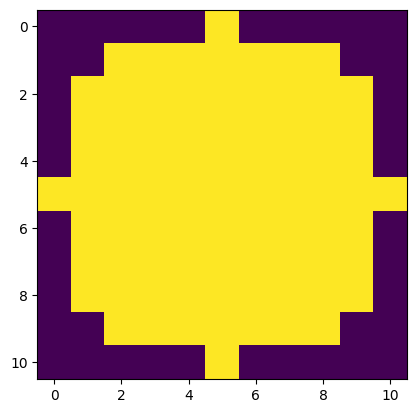

In [ ]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1 1 1 1 1]
 [1 1 1 1 1]]


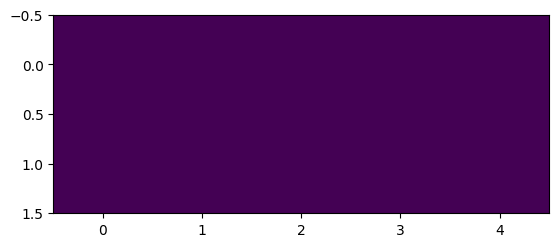

In [ ]:
def line_strell(width,length):
  if student :
    strell = morpho.footprint_rectangle((width,length))
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

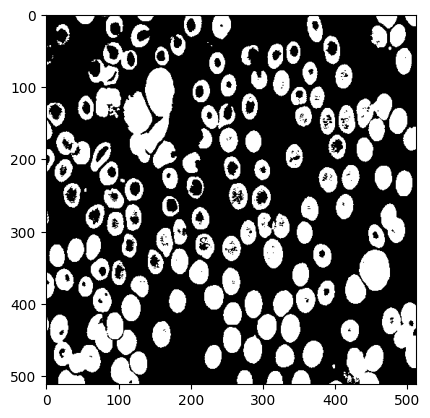

In [ ]:
#load the cell image in grayscale and display it
if student:
  img = skio.imread("cell.tif")
  img_after_treshholding= img<150 # Theresholding and display

  plt.imshow(img_after_treshholding, cmap = "gray")
  plt.show()

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

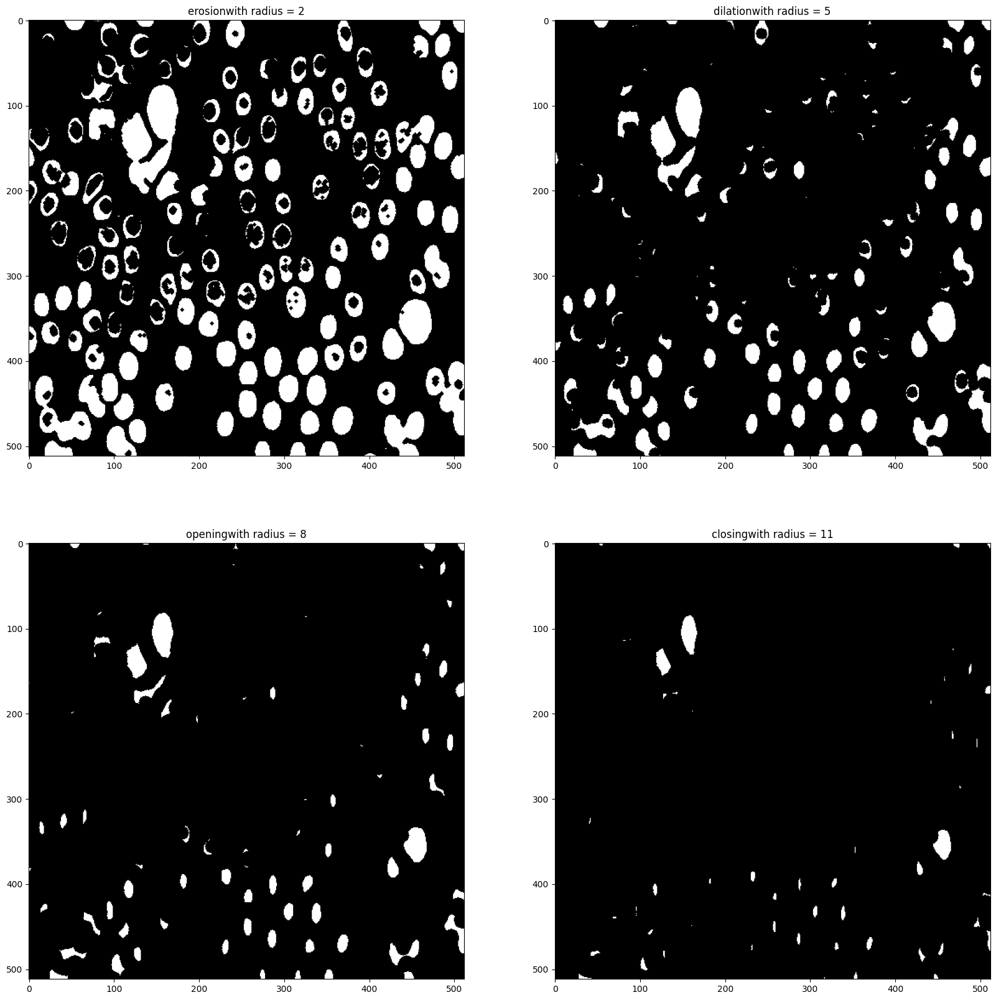

In [ ]:
"""
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
img=img_after_treshholding
imgs = [morpho.binary_erosion(img, strell),morpho.binary_dilation(img,strell),morpho.binary_opening(img, strell),morpho.binary_closing(img,strell)]# Add in this list the 4 images, obtained with the four operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
"""
names = ["erosion","dilation","opening","closing"]
img=img_after_treshholding
student =1
if student :
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs=[]
  for i in range(4):
    strell = morpho.disk(2+3*i)
    imgs.append(morpho.binary_erosion(img, strell))
    names[i] += 'with radius = ' + str(2+3*i)
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()



- **Q** : What is the influence of the shape of the structuring element ?
- **A** : For the case of erosion, structures which not contain at least an instance of the structuring elemnt are deleted.Besides , i think that such erosions modify the shape of these structures by making their borders 'seem more like' the ones of the structuring element than origginal ones.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : For the case of erosion , it seems that increasing the size of the structuring element implies the selection of structures that contain at least the structuring element with its size.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


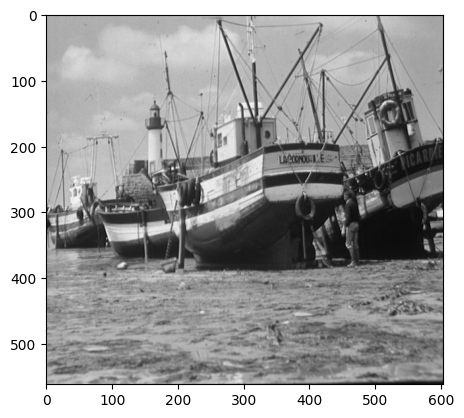

In [ ]:
#load the bateau image in grayscale and display it
if student:
  img = skio.imread("bat.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

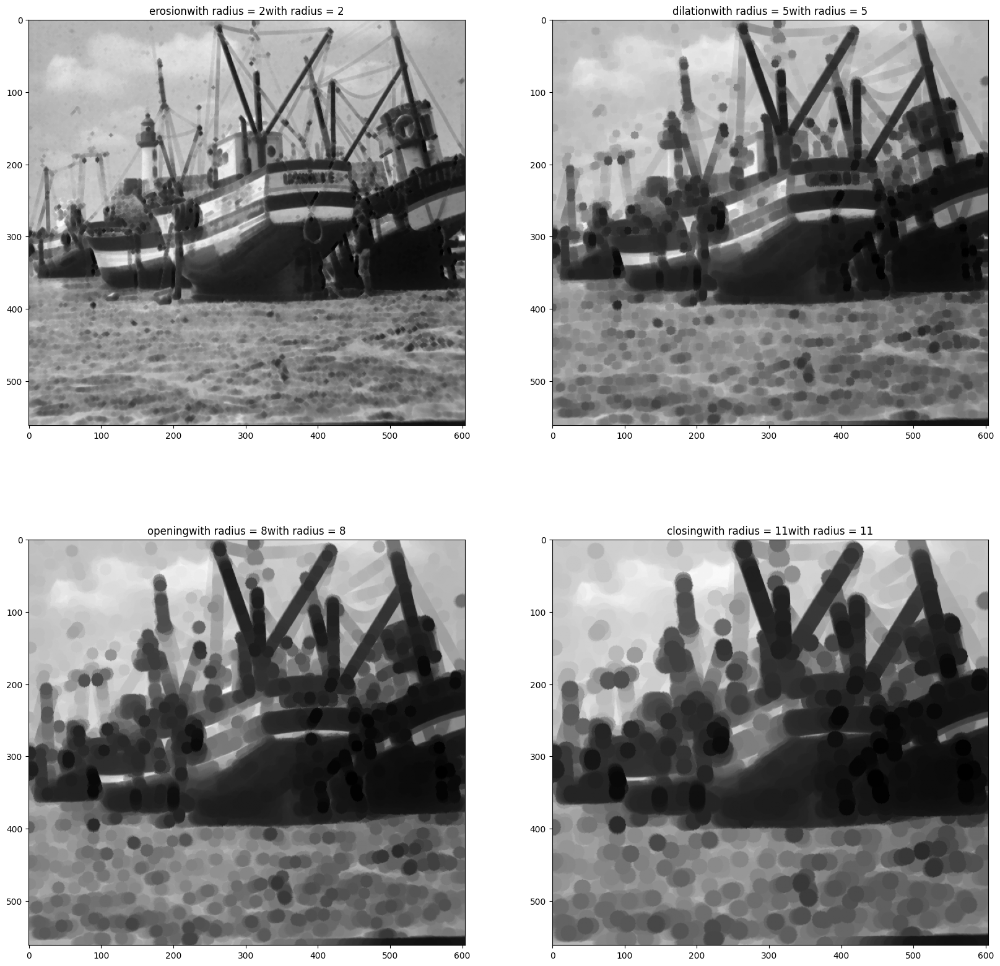

In [ ]:
if student:
  ### start code
  """
  strell = morpho.disk(2)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))

  imgs = [morpho.erosion(img, strell),morpho.dilation(img,strell),morpho.opening(img, strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the four operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

  """
  #img=img_after_treshholding
  student =1

  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs=[]
  for i in range(4):
    strell = morpho.disk(2+3*i)
    imgs.append(morpho.erosion(img, strell))
    names[i] += 'with radius = ' + str(2+3*i)
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()


  ### end code

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : Generally , the more the size is big , the more the delation and erosion are more "severe" (in the sense that the image gets brighter/darker). Besides, the more the structuring element is bigger , the more the image is 'far' from the original image (~similar to applying a more severe low-pass filter)

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : I think that in a continous hypothetical setup , the two operations would be equivalent. But since the circle used in the code is not necessarly a circle (in the strict sense , since the minimal unit is a pixel not a point), some points (i think especially the inclined directions like 45°) which can not be reached by a "discrete" circle of "radius" 5 can be reached a "circle of radius 2 on which each point is remplaced by a circle of radius 3. Hence the sequential delation seems to give a "brigther result" than the single delation.

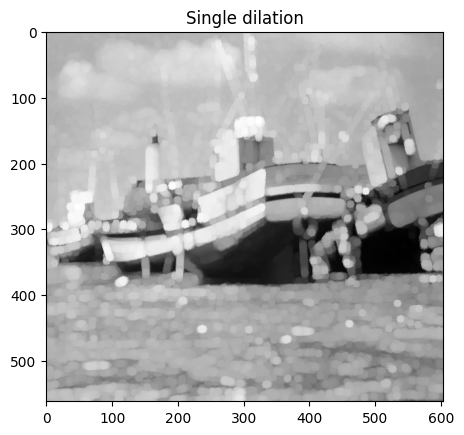

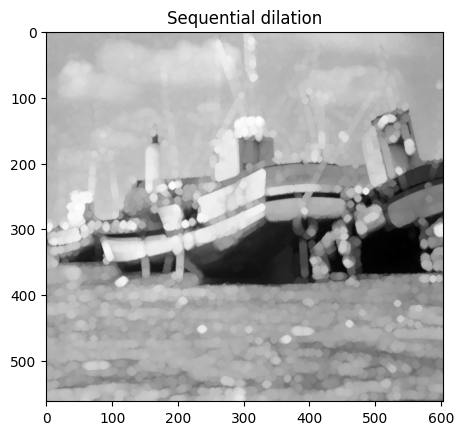

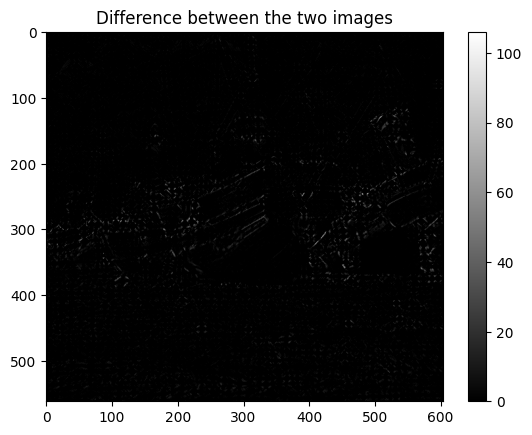

247761


In [ ]:
if student:
  ### start code
  strell2 = morpho.disk(2)
  strell5=  morpho.disk(5)
  dilation2 = morpho.dilation(img,strell2)
  dilation5 = morpho.dilation(img,strell5)
  strell3 = morpho.disk(3)
  sequential_dilation = morpho.dilation(dilation2,strell3)
  plt.imshow(dilation5,cmap = "gray")
  plt.title("Single dilation")
  plt.show()


  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation5-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation5-sequential_dilation)))

- **Q:** Plot the result of an dilation by a disk structuring element of size 2 followed by
an dilation by a disk structuring element of size 3?
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** The two operations are equivalent

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


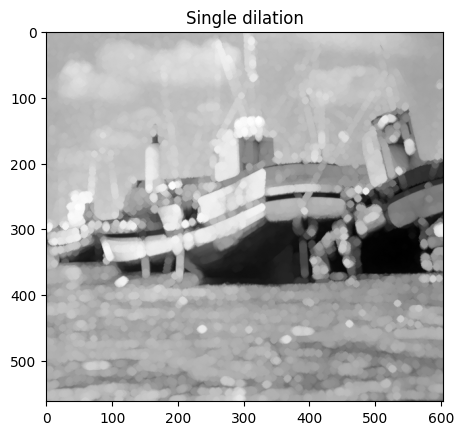

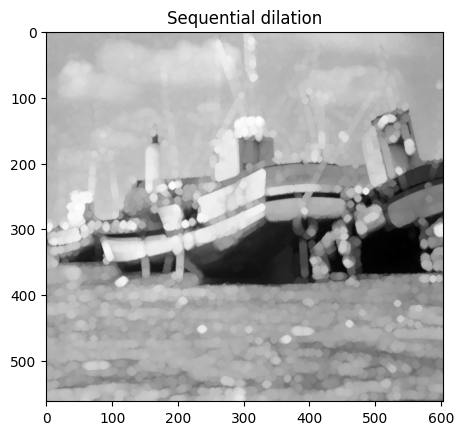

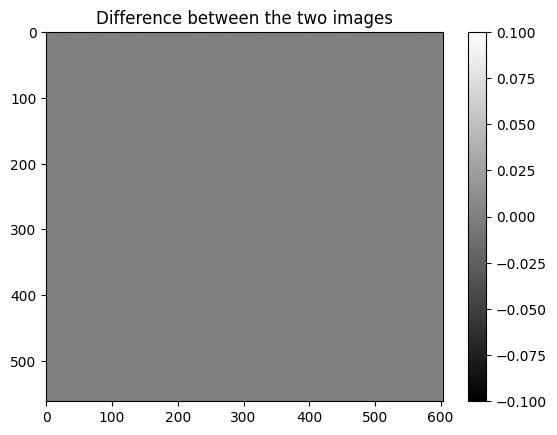

0


In [ ]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell,(3,3),constant_values=(0, 0))

  sqr_strell = morpho.dilation(sqr_strell,morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img,sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


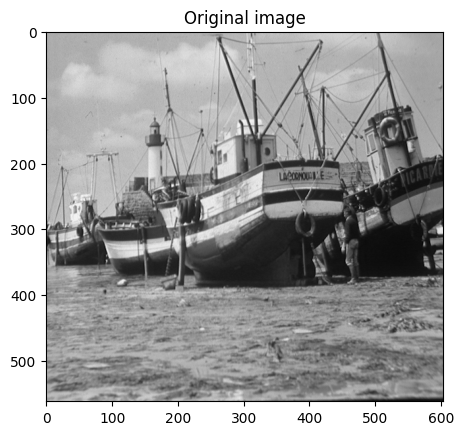

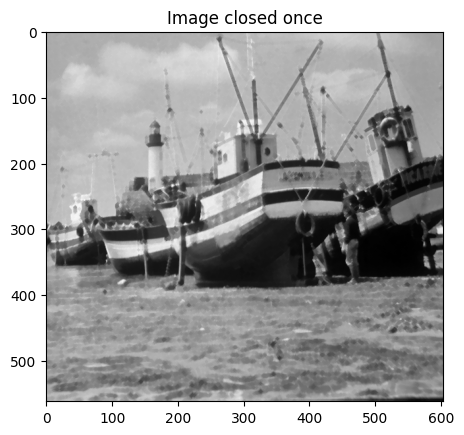

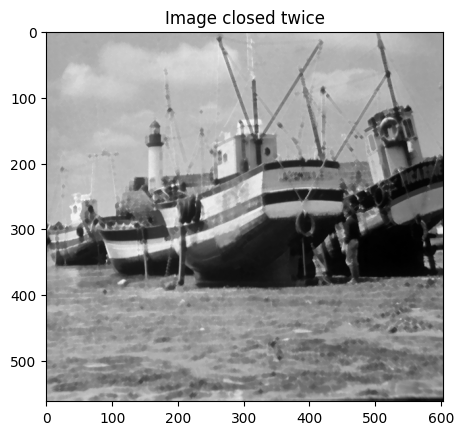

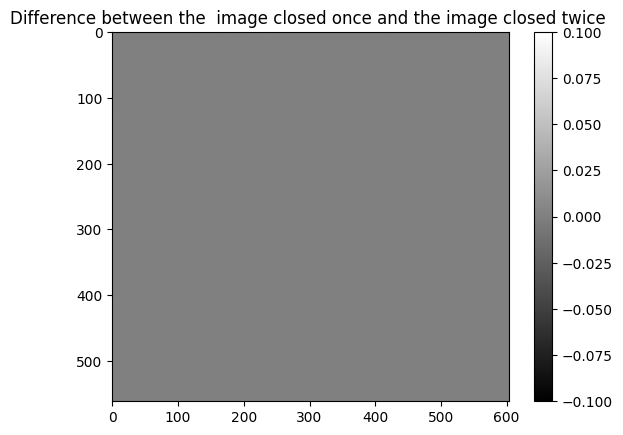

0


In [ ]:
if student :
  plt.imshow(img,cmap = "gray")
  plt.title("Original image")
  plt.show()

  img_closed_once = morpho.closing(img,morpho.disk(2))
  plt.imshow(img_closed_once,cmap = "gray")
  plt.title("Image closed once")
  plt.show()
  img_closed_twice = morpho.closing(img_closed_once,morpho.disk(2))
  plt.imshow(img_closed_twice,cmap = "gray")
  plt.title("Image closed twice")
  plt.show()


  plt.imshow(img_closed_twice-img_closed_once,cmap = "gray")
  plt.title('Difference between the  image closed once and the image closed twice ')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(img_closed_twice-img_closed_once)))

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : I think the top hat transform (from this examples) seems to select the bordures which do not have the same shape as the structuring element. For instance , it seems the vertical lines are more remarkable in the result of a top hat in which i used a circle as a structuring element.

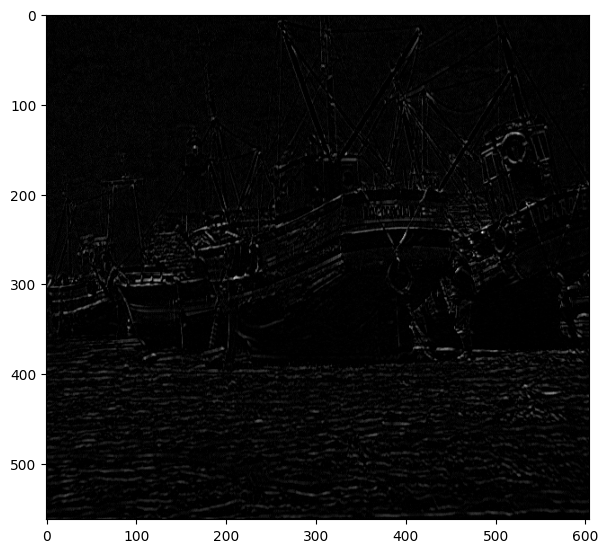

In [ ]:
if student:
  ### start code
  #strell = morpho.disk(2)
  strell=line_strell(5,2)
  top_hat = img-morpho.opening(img,strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

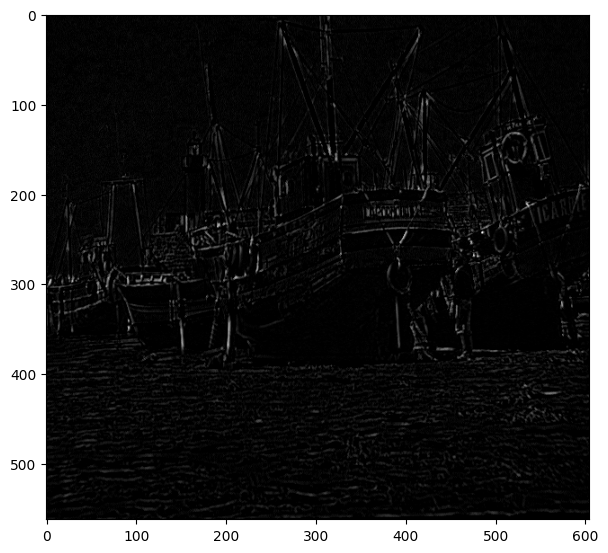

In [ ]:
if student:
  ### start code
  strell = morpho.disk(2)
  #strell=line_strell(2,5)
  top_hat = img-morpho.opening(img,strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : the borders with different shape than the structuring element seem to be the ones more likely to have an upper intensity in the result of closure.

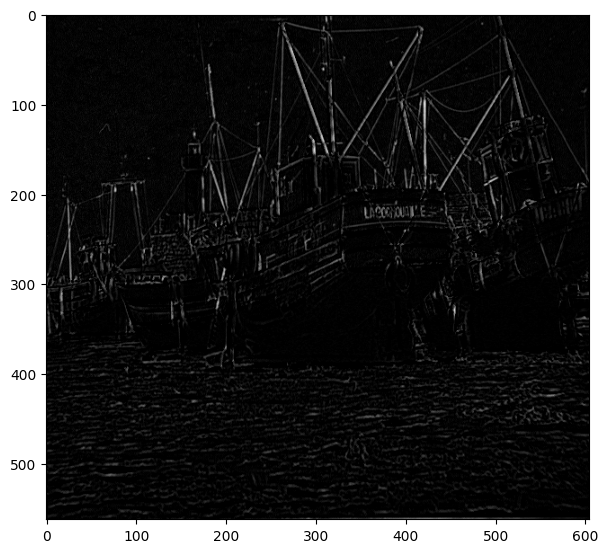

In [ ]:
if student:
  ### start code
  strell = morpho.disk(2)
  dual_top_hat = np.abs(morpho.closing(img,strell)-img)
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

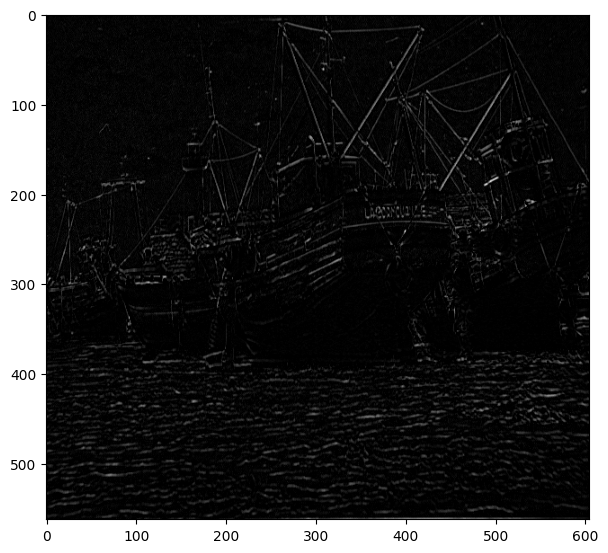

In [ ]:
if student:
  ### start code
  strell = line_strell(5,2)
  dual_top_hat = np.abs(morpho.closing(img,strell)-img)
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: It seems that a low-pass filter(~in the directions of the structuring element) can be epected (fas3,fas4)

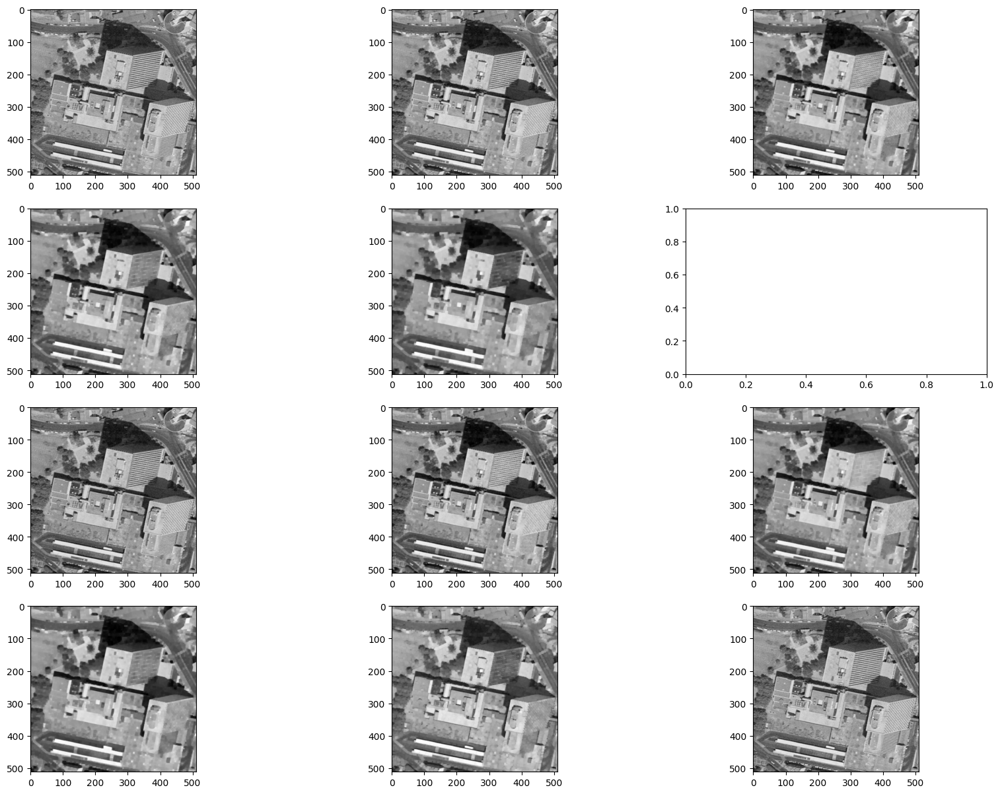

In [ ]:
# Example
img = skio.imread("montreuil.tif")

# Structuring elements
se1=line_strell(1,1)
se2=line_strell(2,2)
se3=line_strell(3,3)
se4=line_strell(4,4)
se5=line_strell(5,5)


# Images
fas1=morpho.closing(morpho.opening(img,se1),se1)
fas2=morpho.closing(morpho.opening(img,se2),se2)
fas3=morpho.closing(morpho.opening(img,se3),se3)
fas4=morpho.closing(morpho.opening(img,se4),se4)
fas5=morpho.closing(morpho.opening(img,se5),se5)

fig,ax = plt.subplots(4,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
#ax[1,2].imshow(img,cmap = "gray")


#Try you own
if student :
  se1=line_strell(1,1)
  se2=line_strell(2,2)
  se3=line_strell(3,3)
  se4=line_strell(4,4)
  se5=line_strell(5,5)


  # Images
  fas1=morpho.closing(morpho.opening(img,se1),se2)
  fas2=morpho.closing(morpho.opening(img,se2),se3)
  fas3=morpho.closing(morpho.opening(img,se3),se4)
  fas4=morpho.closing(morpho.opening(img,se4),se5)
  fas5=morpho.closing(morpho.opening(img,se5),se1)
  ax[2,0].imshow(fas1,cmap = "gray")
  ax[2,1].imshow(fas2,cmap = "gray")
  ax[2,2].imshow(fas3,cmap = "gray")
  ax[3,0].imshow(fas4,cmap = "gray")
  ax[3,1].imshow(fas5,cmap = "gray")
  ax[3,2].imshow(img,cmap = "gray")
  plt.show()


### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) ...

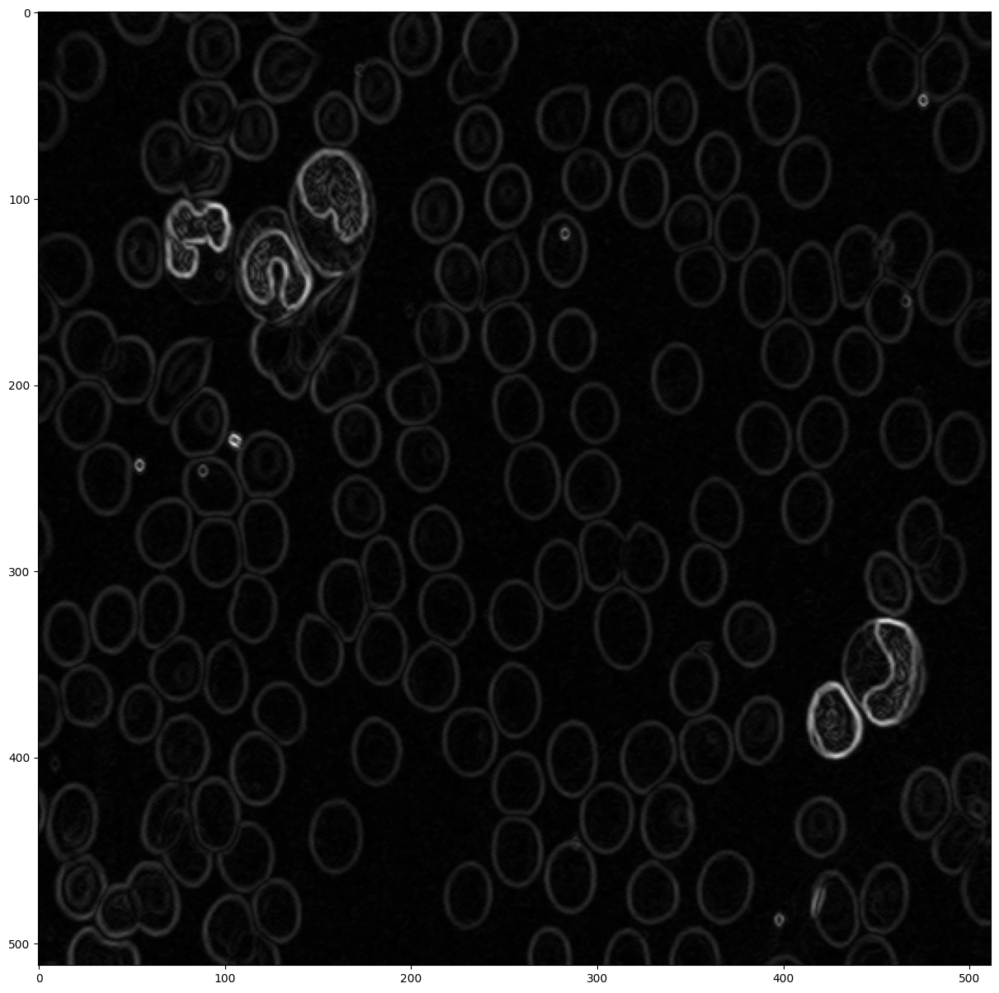

In [ ]:
if student :
  img = skio.imread("cell.tif")
  morpho_grad = morpho.dilation(img,morpho.disk(1))-morpho.erosion(img,morpho.disk(1))
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) ...

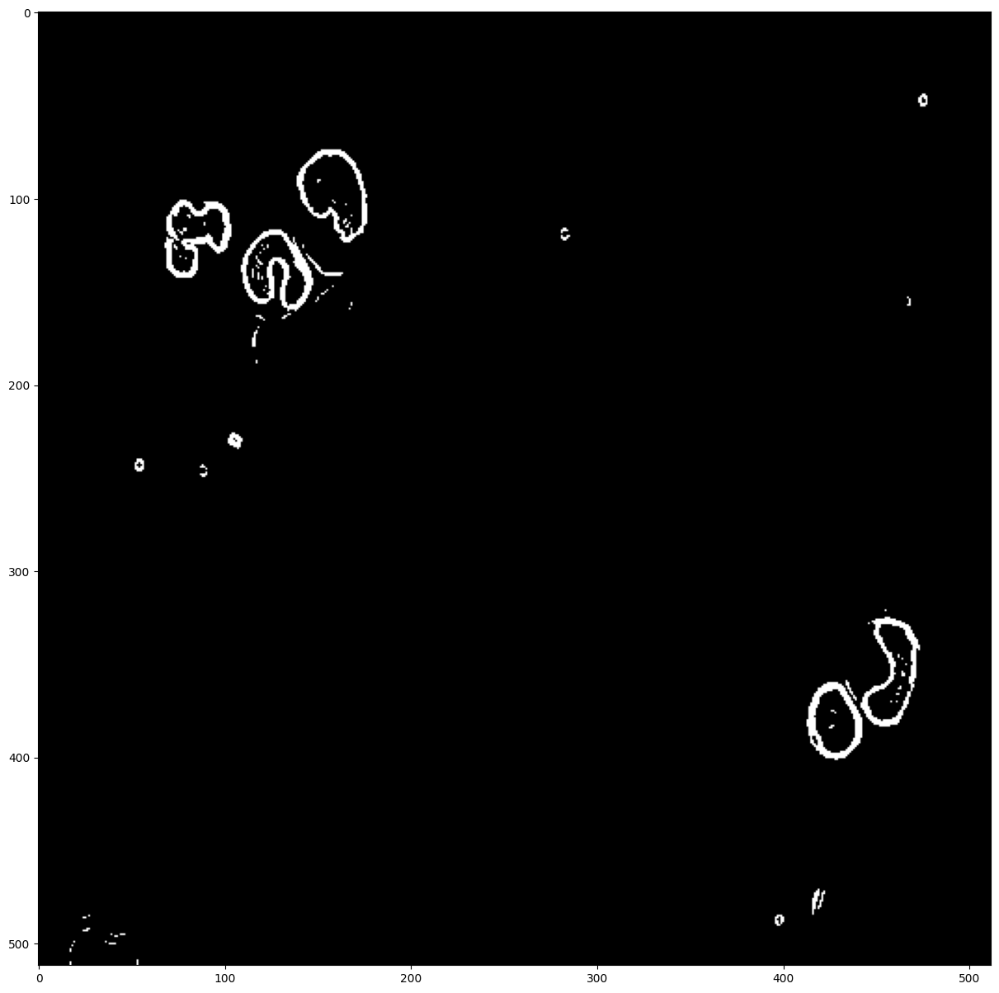

In [ ]:
if student :
  thresh_grad = morpho_grad>25
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using seg.watershed(morpho_grad,k) ;
What do you observe ?
- **A** :(code in the next cell) ...
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) ...

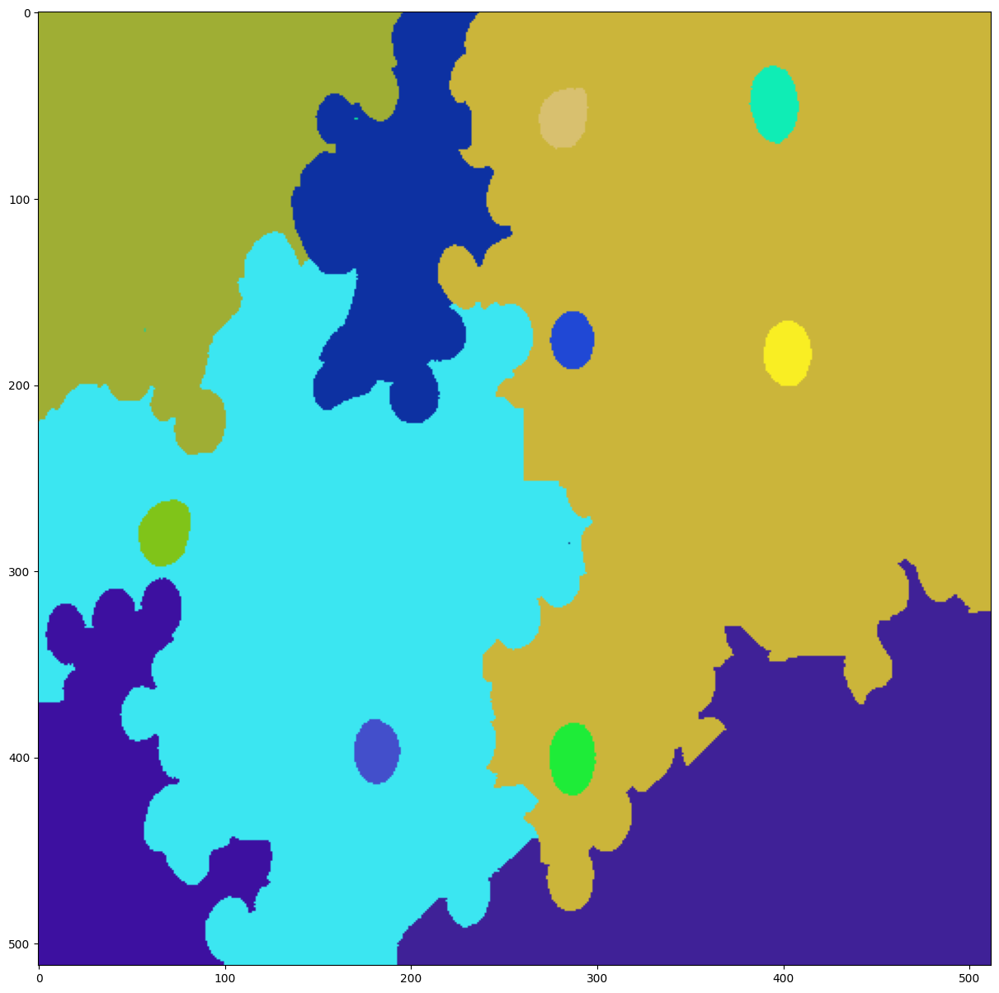

In [ ]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = seg.watershed(morpho_grad,20)
plt.figure(figsize =(15,15))

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) ...
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous?
- **A** : (code in the next cell) ...

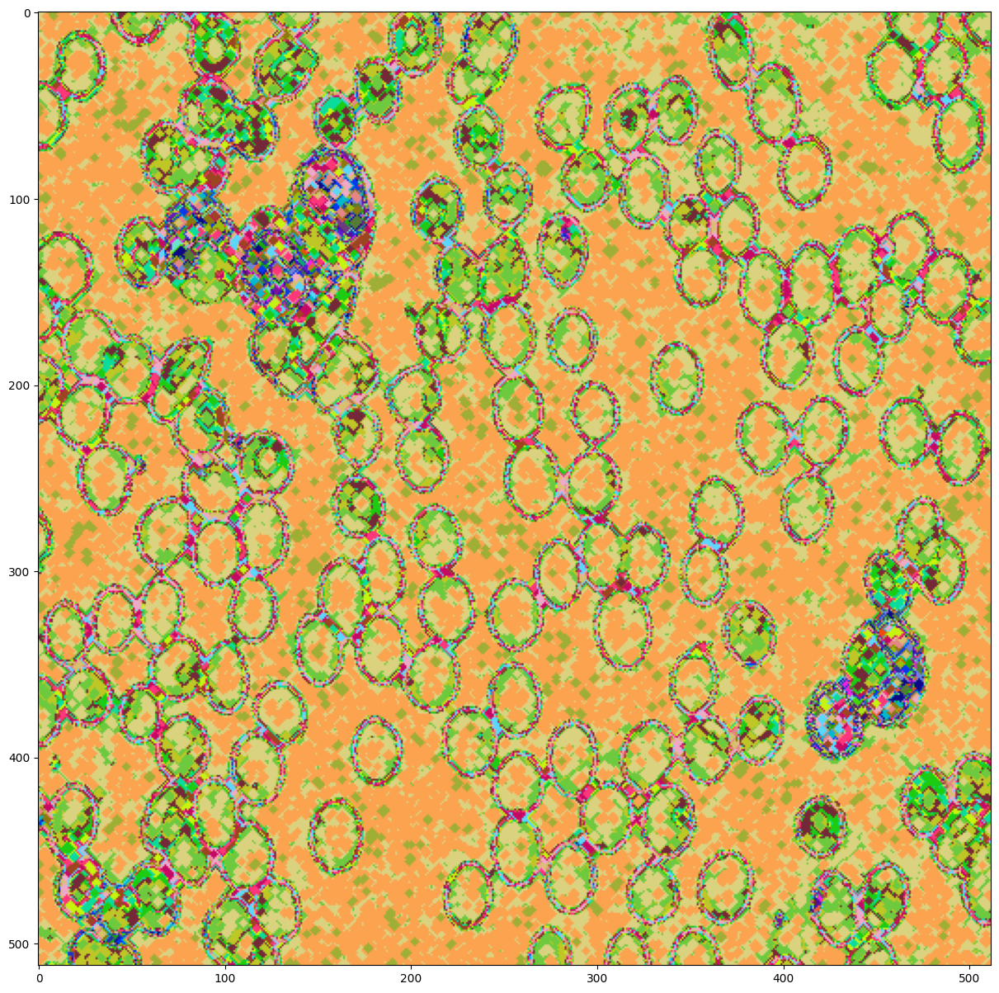

In [ ]:
if student :
  wat_closing = morpho.closing(morpho_grad,morpho.disk(2))
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

In [ ]:
if student :
  wat_opening = ...
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : ...

In [ ]:
imOpen = ...
reco=...
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : ...

In [ ]:
imClos = ...
reco=...
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

In [ ]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()